In [1]:
import cv2
import base64
import torch
import torchvision
import pandas as pd
import numpy as np

from services.augmentations import get_infer_augmentation
from services.model import InferImages
from services.service import visualize


import warnings
%matplotlib inline

In [2]:
import colorsys

PATH_TO_MODEL = '/home/tim/work/tashkent/traffic/model.pt'

TO_NAME = {0: 'Informational_sign',
  1: 'Warning_sign',
  2: 'Forbidding_sign',
  3: 'Additional_info_sign',
  4: 'Priority_sign',
  5: 'Prescriptive_sign',
  6: 'Service_sign'}

N = len(TO_NAME)
HSV_tuples = [(x*1.0/N, 0.5, 0.5) for x in range(N)]
RGB_tuples = list(map(lambda x: (np.array(colorsys.hsv_to_rgb(*x))).tolist(), HSV_tuples))

TO_COLOR = dict(zip(range(N), RGB_tuples))

PATH = '/home/tim/work/tashkent/traffic/cutting_video/'

In [3]:
def to_numpy(boxes, labels, scores):
    boxes_new, labels_new, scores_new = [], [], []
    if len(scores) != 0:
        for i in range(len(scores)):
            if scores[i] >= 0.7:
                boxes_new.append(boxes[i].int().cpu().detach().numpy())
                labels_new.append(int(labels[i].cpu().detach()))
                scores_new.append(scores[i].cpu().detach().numpy())
    return boxes_new, labels_new, scores_new

def img_numpy(image):
    return image[0].permute(1, 2, 0).cpu().numpy()[:,:,::-1]

def process_image(image, model):
    image[0] = image[0].to('cuda')
    return model([image[0]])[1][0].values()

def build_zeros(labels):
    len_rows = len(labels)
    len_cols = 5
    return np.zeros((len_rows, len_cols))

In [4]:
model = torch.jit.load(PATH_TO_MODEL, map_location='cuda')
model = model.eval()

In [5]:
tranfrorm_val = get_infer_augmentation(640, 720)
infer = InferImages(1, tranfrorm_val)

In [6]:
i = 12
############
infer.append([PATH + f'out-2{i}.jpg'])
image = infer()
############
boxes, labels, scores = process_image(image, model)
boxes, labels, scores = to_numpy(boxes, labels, scores)
############
image = img_numpy(image)
boxes, labels, scores

/home/tim/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1190: UserWarning: operator() sees varying value in profiling, ignoring and this should be handled by GUARD logic (Triggered internally at ../torch/csrc/jit/codegen/cuda/parser.cpp:3668.)
  return forward_call(*input, **kwargs)
code/__torch__/torchvision/models/detection/faster_rcnn.py:103: UserWarning: RCNN always returns a (Losses, Detections) tuple in scripting


([array([345, 344, 358, 371], dtype=int32),
  array([346, 371, 358, 394], dtype=int32)],
 [5, 1],
 [array(0.9484112, dtype=float32), array(0.8924824, dtype=float32)])

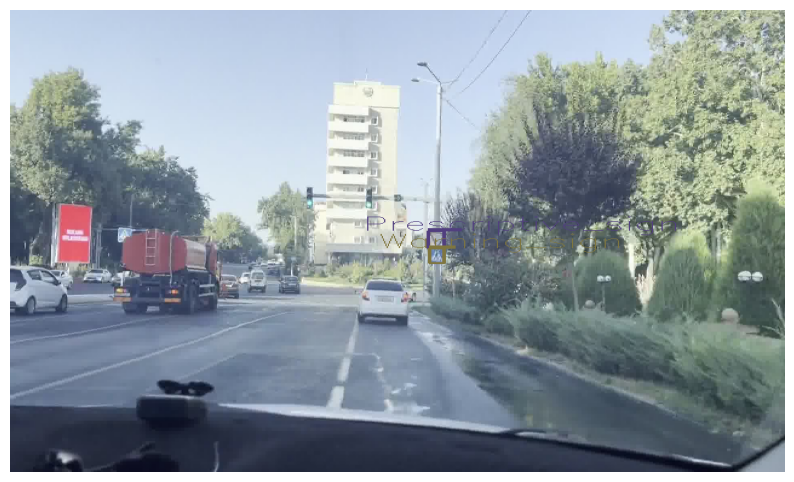

In [7]:
visualize(image, boxes, labels, TO_NAME, TO_COLOR)

In [8]:
from services.sort import Sort
mot_tracker = Sort(min_hits=2, iou_threshold=0)

In [9]:
### TODO Build all in one Class!!!

12
boxes [array([345, 344, 358, 371], dtype=int32), array([346, 371, 358, 394], dtype=int32)] 
 scores [array(0.9484112, dtype=float32), array(0.8924824, dtype=float32)] 
 labels [5, 1]
[[345.         344.         358.         371.           0.94841123]
 [346.         371.         358.         394.           0.8924824 ]]
[[346. 371. 358. 394.   2.]
 [345. 344. 358. 371.   1.]]
13


/home/tim/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1190: UserWarning: FALLBACK path has been taken inside: runCudaFusionGroup. This is an indication that codegen Failed for some reason.
To debug try disable codegen fallback path via setting the env variable `export PYTORCH_NVFUSER_DISABLE=fallback`
 (Triggered internally at ../torch/csrc/jit/codegen/cuda/manager.cpp:331.)
  return forward_call(*input, **kwargs)


boxes [array([350, 367, 363, 395], dtype=int32), array([350, 338, 364, 367], dtype=int32)] 
 scores [array(0.96896344, dtype=float32), array(0.94337696, dtype=float32)] 
 labels [1, 5]
[[350.         367.         363.         395.           0.96896344]
 [350.         338.         364.         367.           0.94337696]]
[[349.81158713 367.39689864 363.18751395 394.603401     2.        ]
 [350.00433408 337.99233822 363.99456724 367.00866059   1.        ]]
14
boxes [array([355, 363, 370, 394], dtype=int32)] 
 scores [array(0.95572126, dtype=float32)] 
 labels [1]
[[355.         363.         370.         394.           0.95572126]]
[[354.89177126 363.17067167 369.93099902 393.94725225   2.        ]]
15
boxes [array([362, 357, 379, 389], dtype=int32), array([362, 324, 380, 357], dtype=int32)] 
 scores [array(0.97756803, dtype=float32), array(0.9523676, dtype=float32)] 
 labels [1, 5]
[[362.         357.         379.         389.           0.97756803]
 [362.         324.         380.       

/home/tim/work/tashkent/traffic/traffic-detection/detection/services/service.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


[]
45
[]
46
[]
47
[]
48
[]


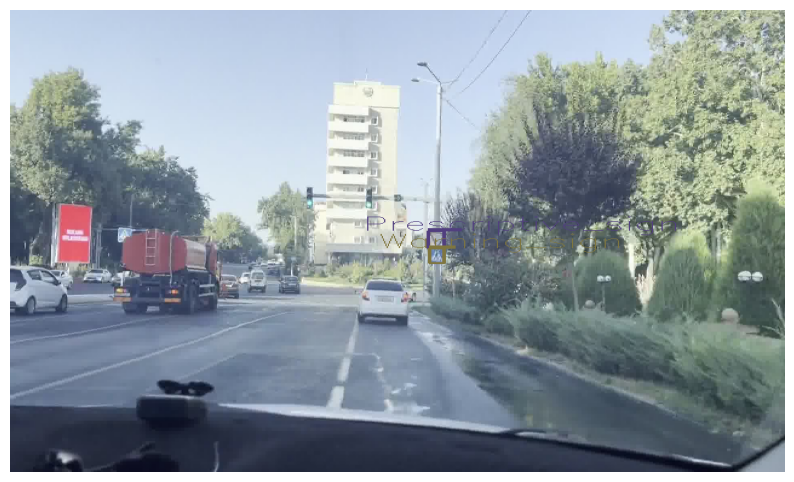

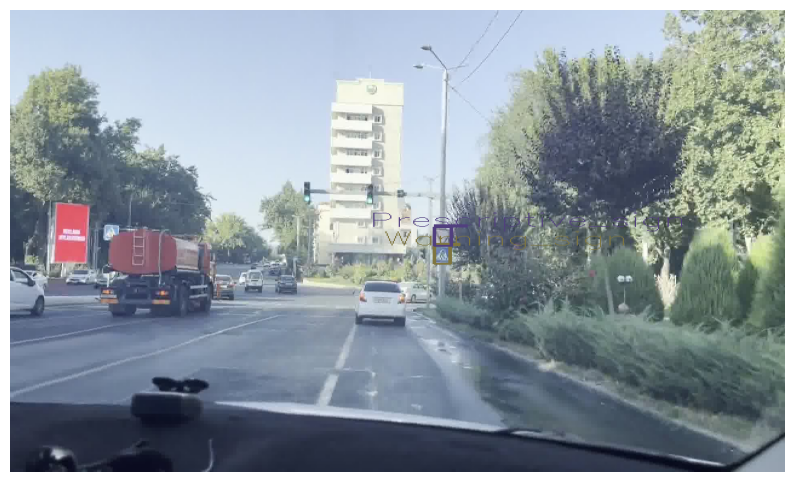

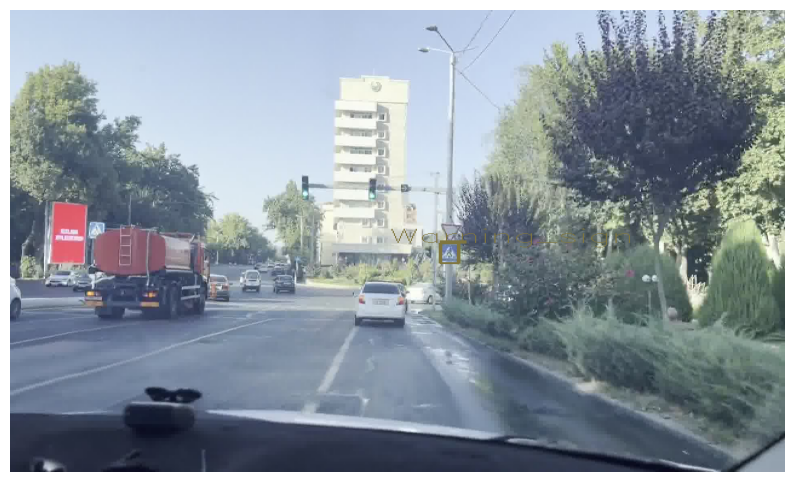

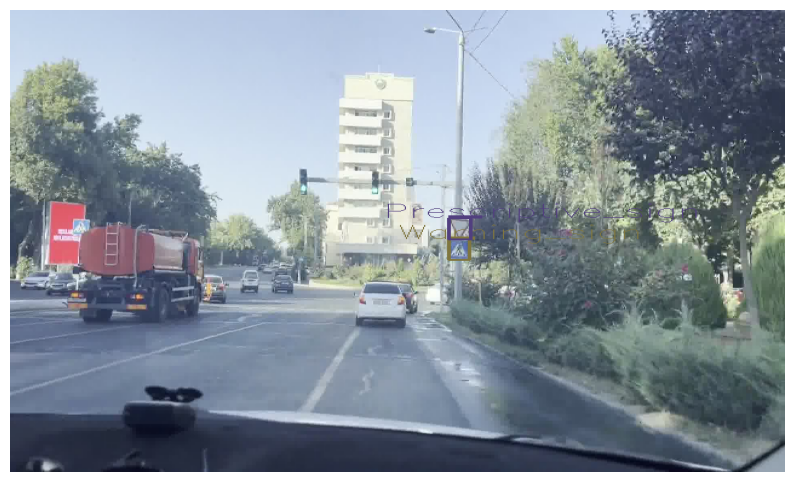

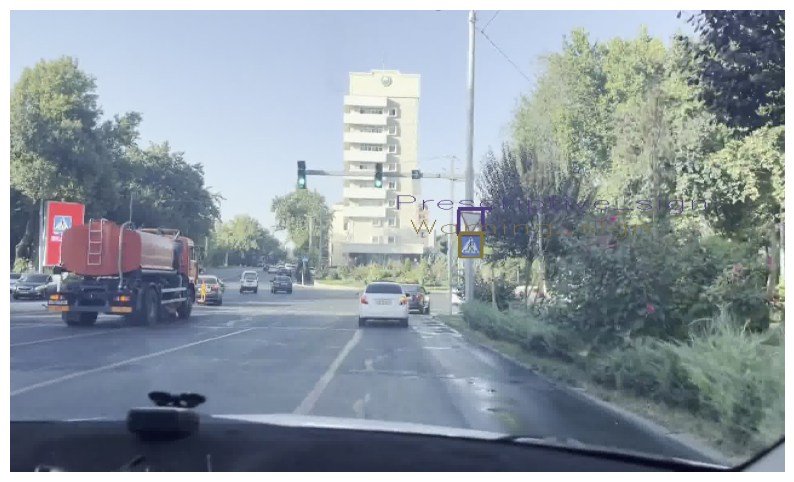

...

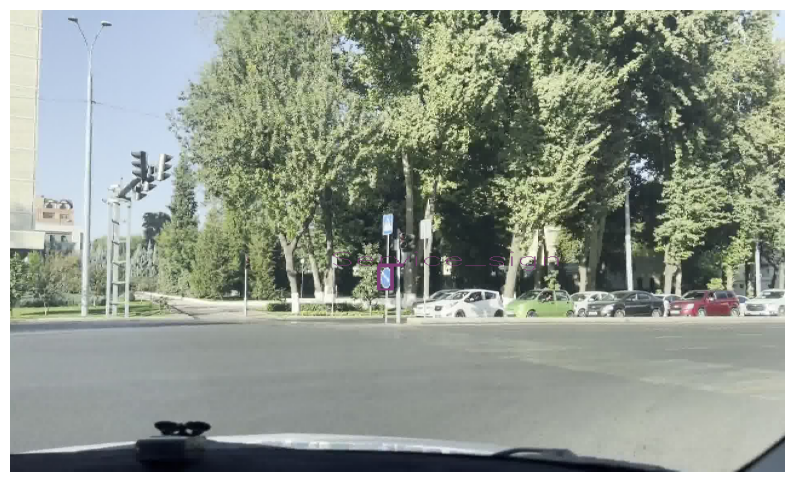

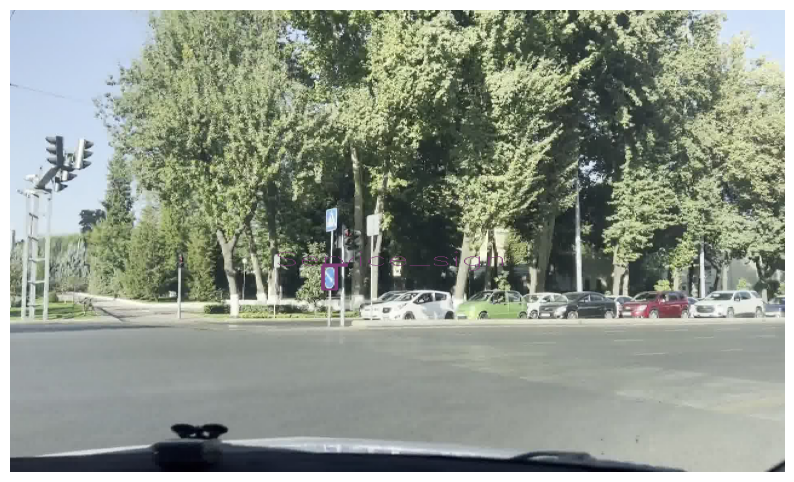

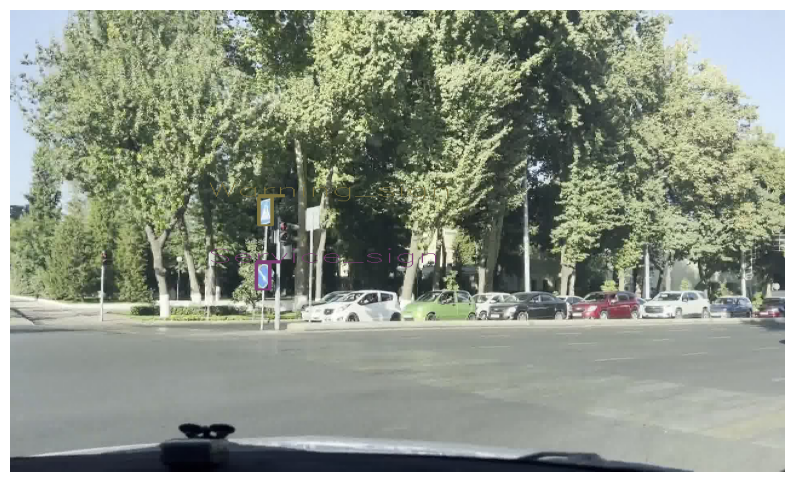

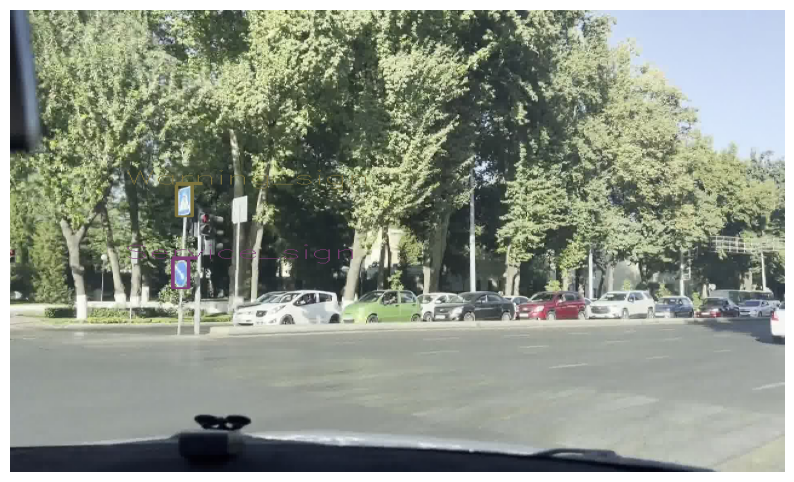

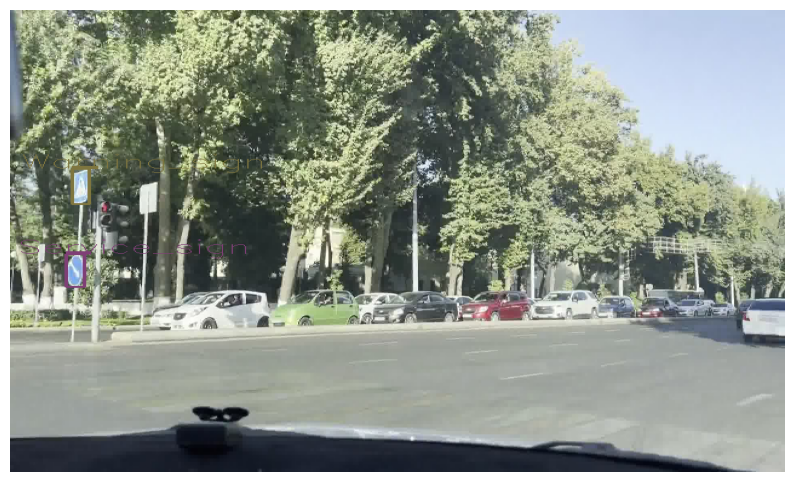

In [10]:
list_of_track = []
for i in range(12, 49):
    print(i)
    infer.append([PATH + f'out-2{i}.jpg'])
    image = infer()
    boxes, labels, scores = process_image(image, model)
    image = img_numpy(image)
    boxes, labels, scores = to_numpy(boxes, labels, scores)
    if len(scores) >= 1:
        
        visualize(image, boxes, labels, TO_NAME, TO_COLOR)
        print('boxes', boxes, '\n', 'scores', scores,'\n', 'labels', labels)
        zeros = build_zeros(labels)
        zeros[:,:4] += boxes
        zeros[:,4] += scores
        # zeros = np.expand_dims(zeros, axis=0)
        print(zeros)
        ret = mot_tracker.update(zeros)
        list_of_track.append(ret)
    else:
        ret = mot_tracker.update(np.empty((0, 5)))

    print(ret)